## Install YOLOv8

⚠️ YOLOv8 is still under heavy development. Breaking changes are being introduced almost weekly. We strive to make our YOLOv8 notebooks work with the latest version of the library. Last tests took place on **27.01.2023** with version **YOLOv8.0.20**.

If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

YOLOv8 can be installed in two ways - from the source and via pip. This is because it is the first iteration of YOLO to have an official package.

In [ ]:
# Pip install method (recommended)

!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 25.8/78.2 GB disk)


In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

## Preparing  dataset






In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="Mbqxt1rQlJiBA9FHwXfo")
project = rf.workspace("mahfoudhi-ali-w8cnf").project("ship-detection-odorz")
dataset = project.version(5).download("yolov8")

mkdir: cannot create directory ‘/content/datasets’: File exists
/content/datasets
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to ship-detection-5 in yolov8:: 100%|██████████| 2016/2016 [00:00<00:00, 2276.54it/s]


##  Training

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=25 imgsz=800 plots=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/ship-detection-5/data.yaml, epochs=25, patience=50, batch=16, imgsz=800, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, keras=False, optimize=False, int8=False, dynami

In [ ]:
!ls {HOME}/runs/detect/train2/

args.yaml					    train_batch2.jpg
confusion_matrix.png				    train_batch660.jpg
events.out.tfevents.1677760685.b43658dff89b.6169.0  train_batch661.jpg
F1_curve.png					    train_batch662.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
R_curve.png					    val_batch1_labels.jpg
results.csv					    val_batch1_pred.jpg
results.png					    val_batch2_labels.jpg
train_batch0.jpg				    val_batch2_pred.jpg
train_batch1.jpg				    weights


/content


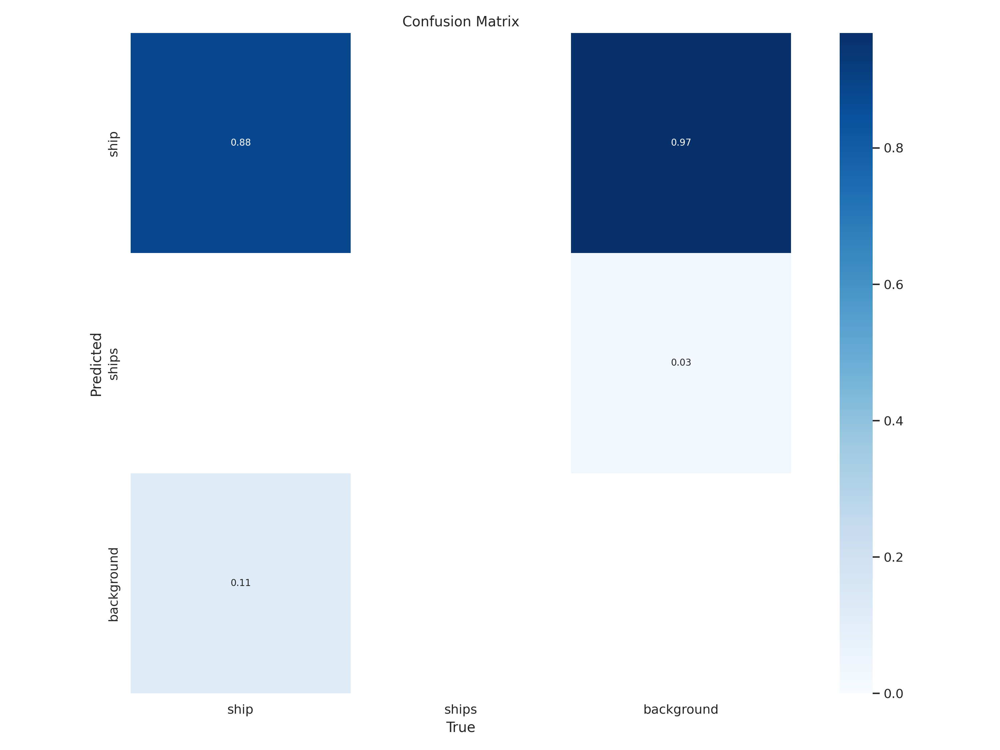

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/confusion_matrix.png', width=600)

/content


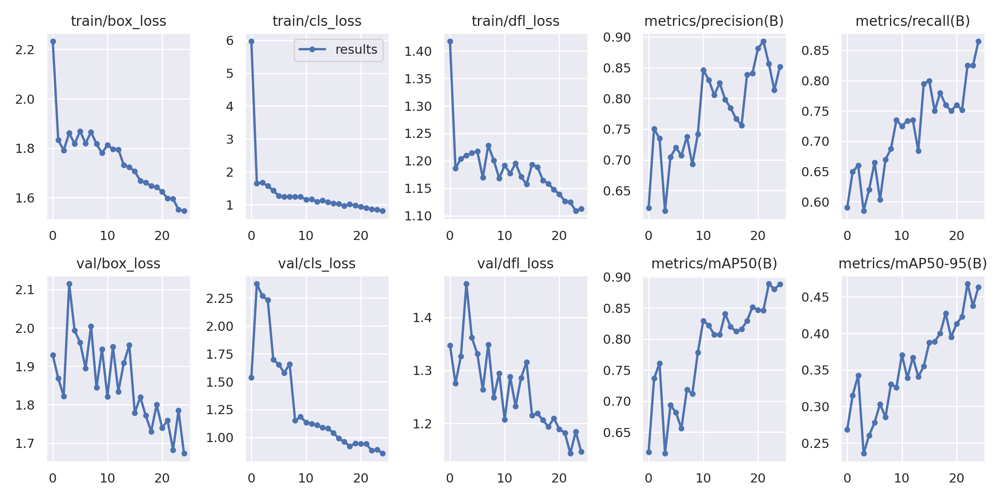

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train2/results.png', width=600)

/content


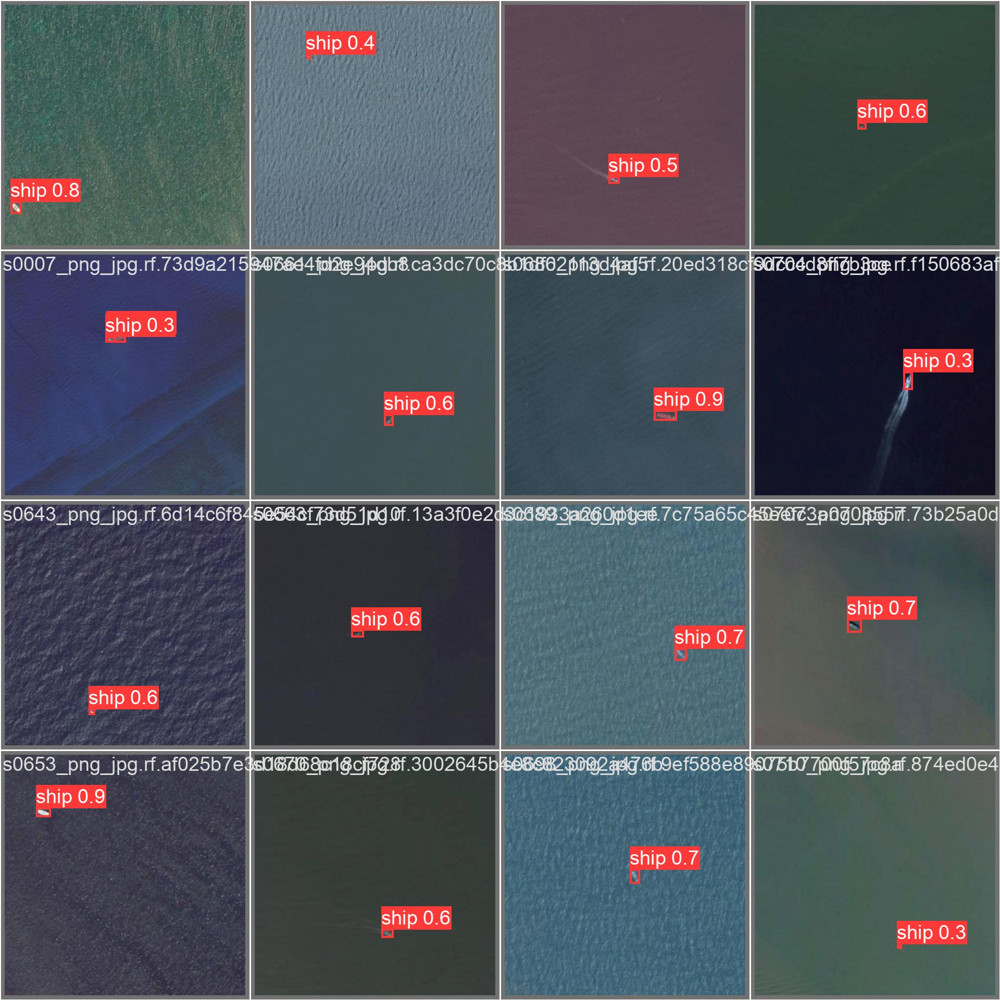

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/val_batch0_pred.jpg', width=600)

## Validate Model

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/ship-detection-5/valid/labels.cache... 200 images, 0 backgrounds, 0 corrupt: 100% 200/200 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 13/13 [00:08<00:00,  1.52it/s]
                   all        200        200      0.863       0.82      0.888      0.466
                  ship        200        200      0.863       0.82      0.888      0.466
Speed: 5.9ms pre-process, 14.6ms inference, 0.0ms loss, 3.5ms post-process per image


## Inference with Model

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
image 1/100 /content/datasets/ship-detection-5/test/images/s0023_png_jpg.rf.b147fd819e4e824776bf98c009101e99.jpg: 800x800 1 ship, 26.1ms
image 2/100 /content/datasets/ship-detection-5/test/images/s0024_png_jpg.rf.cbdab9bcf5a00b12598d4f9c823025e2.jpg: 800x800 1 ship, 26.2ms
image 3/100 /content/datasets/ship-detection-5/test/images/s0029_png_jpg.rf.cb97bcb33d73175126de37fc656a52ce.jpg: 800x800 1 ship, 26.1ms
image 4/100 /content/datasets/ship-detection-5/test/images/s0033_png_jpg.rf.02d670ca71fd1c68e661d307c511c821.jpg: 800x800 2 ships, 26.2ms
image 5/100 /content/datasets/ship-detection-5/test/images/s0035_png_jpg.rf.080745b4fcee28a139d6dd1d37dcdc53.jpg: 800x800 1 ship, 22.1ms
image 6/100 /content/datasets/ship-detection-5/test/images/s0037_png_jpg.rf.d3be633d8d0d9f2577b812a28a917a6f.jpg: 800x800 1 ship, 22.0ms


**NOTE:** Let's take a look at few results.

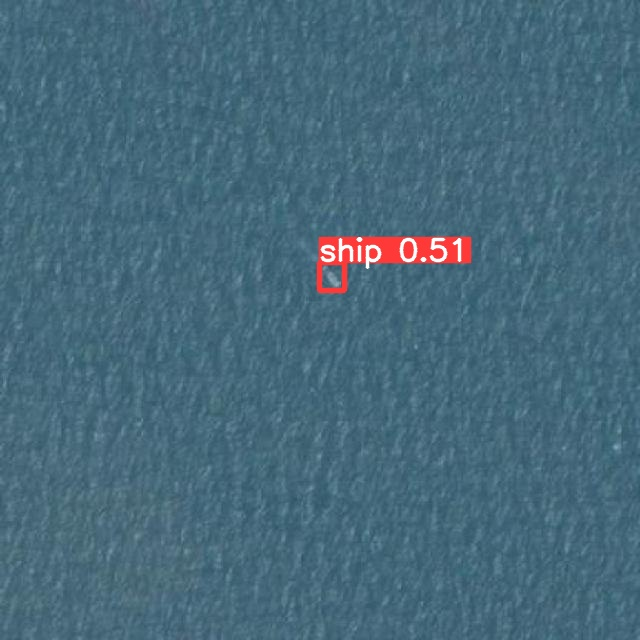

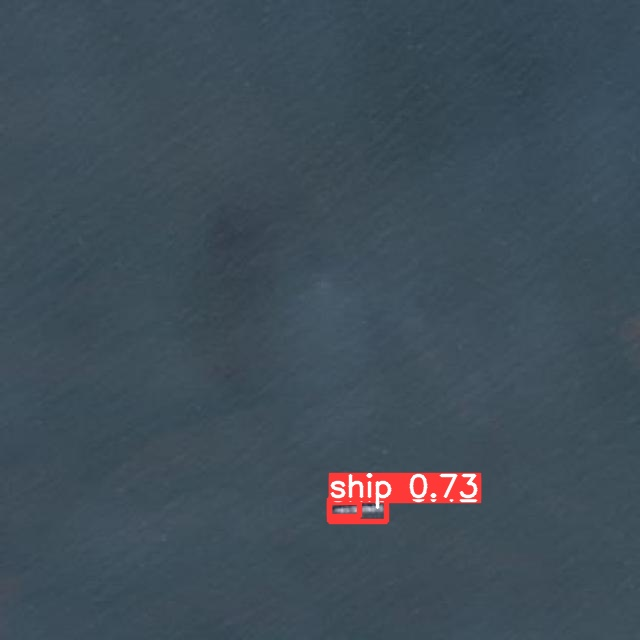

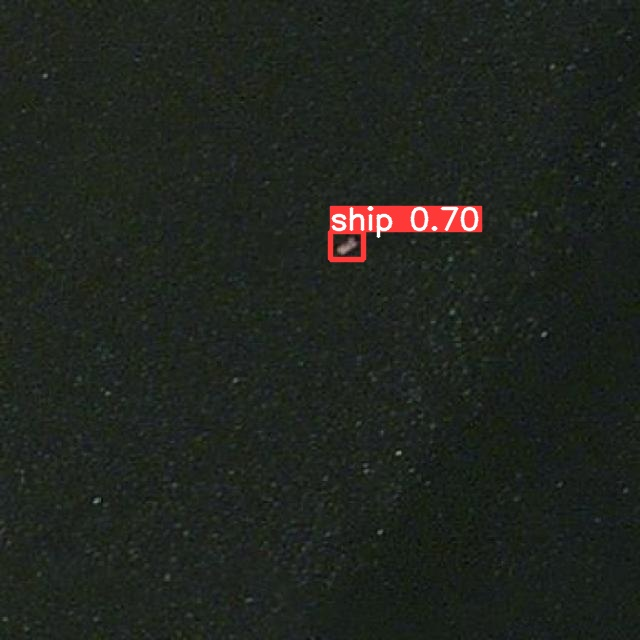

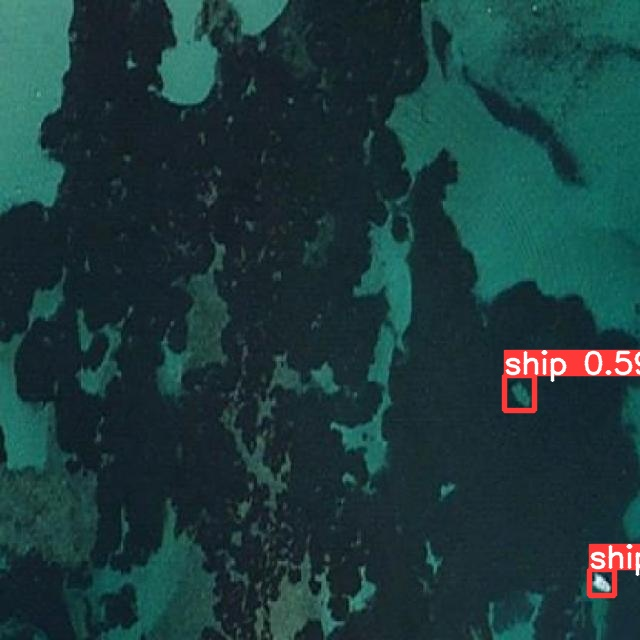

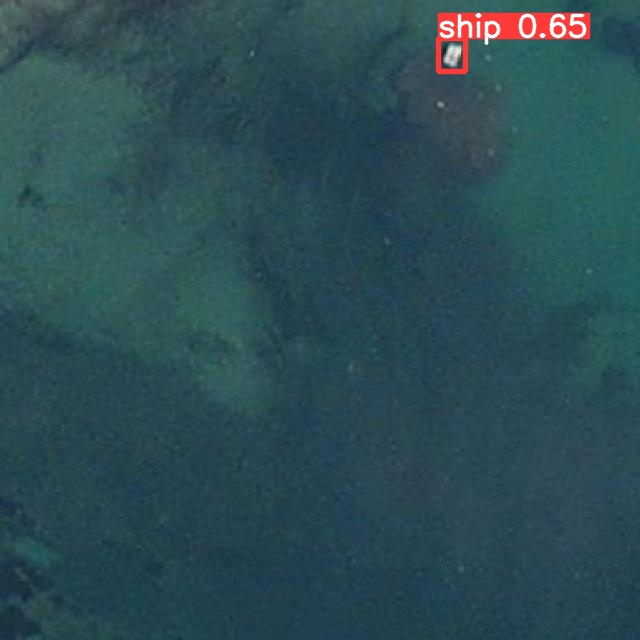

...

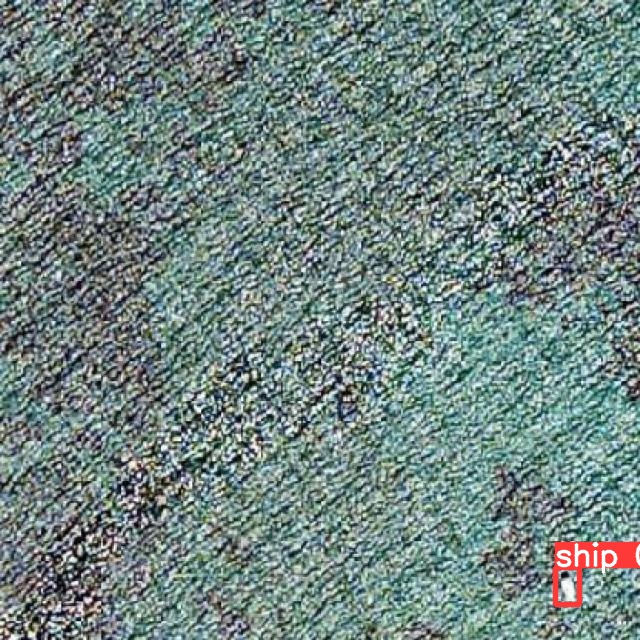

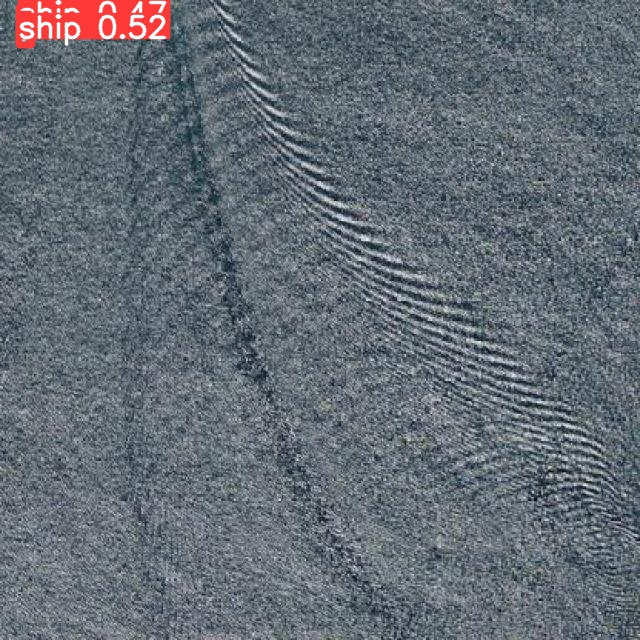

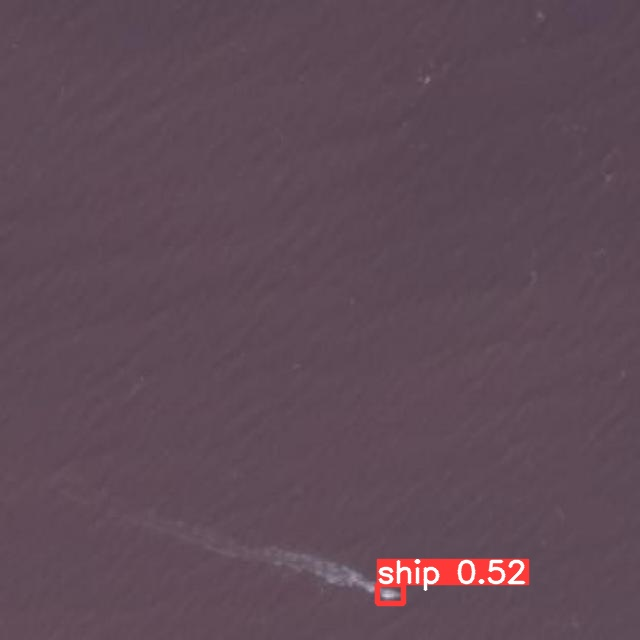

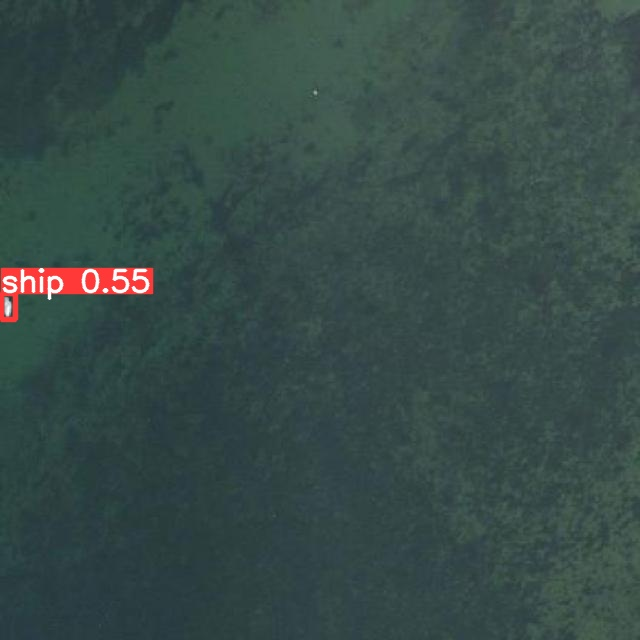

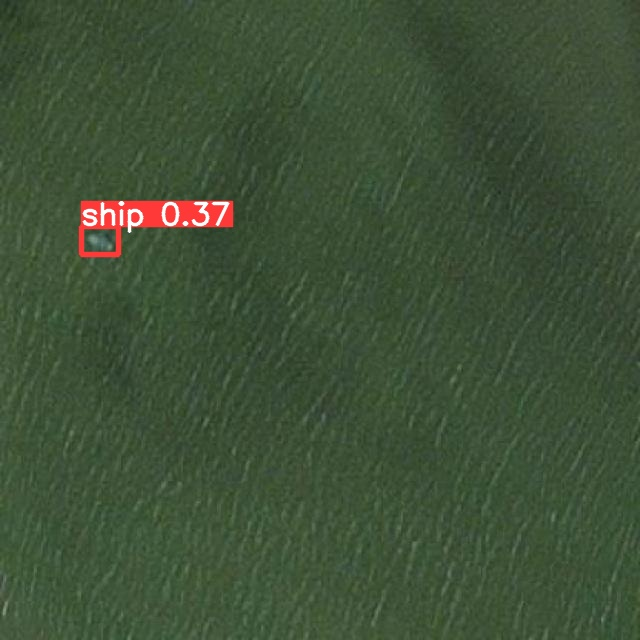

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict2/*.jpg'):
      display(Image(filename=image_path, width=600))
      print("\n")

In [ ]:
%cd /content/datasets/ship-detection-5/

/content/datasets/ship-detection-5


In [ ]:
%mkdir test2


In [ ]:
%mkdir image

In [ ]:
%cd /content/datasets/ship-detection-5/test2/image/

/content/datasets/ship-detection-5/test2/image


In [ ]:
from google.colab import files
from IPython.display import Image

In [ ]:
uploaded = files.upload()

Saving New test  (1).png to New test  (1).png
Saving New test  (2).png to New test  (2).png
Saving New test  (3).png to New test  (3).png


In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test2/image save=True


/content
Ultralytics YOLOv8.0.20 🚀 Python-3.8.10 torch-1.13.1+cu116 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11126358 parameters, 0 gradients, 28.4 GFLOPs
image 1/3 /content/datasets/ship-detection-5/test2/image/New test  (1).png: 800x800 15 shipss, 26.1ms
image 2/3 /content/datasets/ship-detection-5/test2/image/New test  (2).png: 800x800 11 ships, 4 shipss, 26.1ms
image 3/3 /content/datasets/ship-detection-5/test2/image/New test  (3).png: 800x800 6 ships, 10 shipss, 26.1ms
Speed: 0.8ms pre-process, 26.1ms inference, 1.6ms postprocess per image at shape (1, 3, 800, 800)
Results saved to runs/detect/predict3


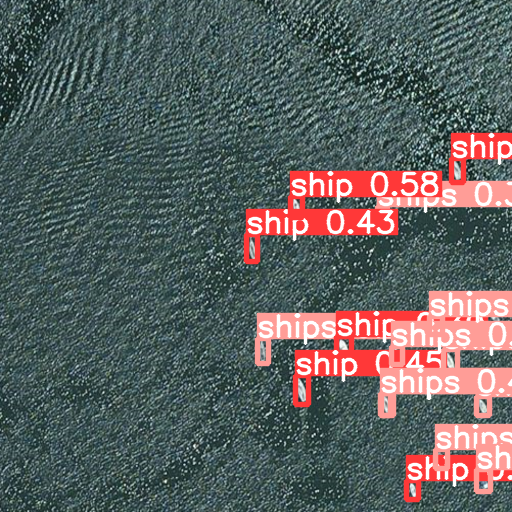

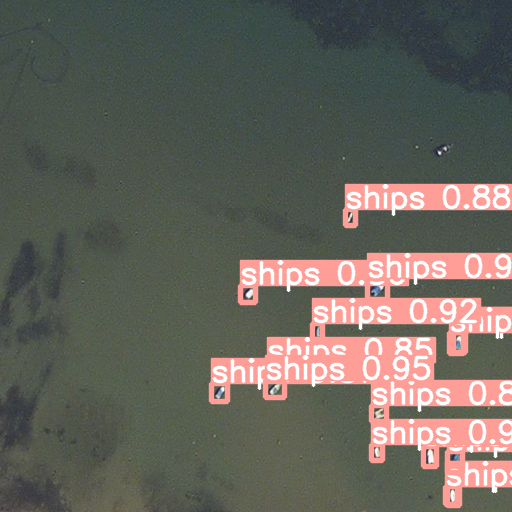

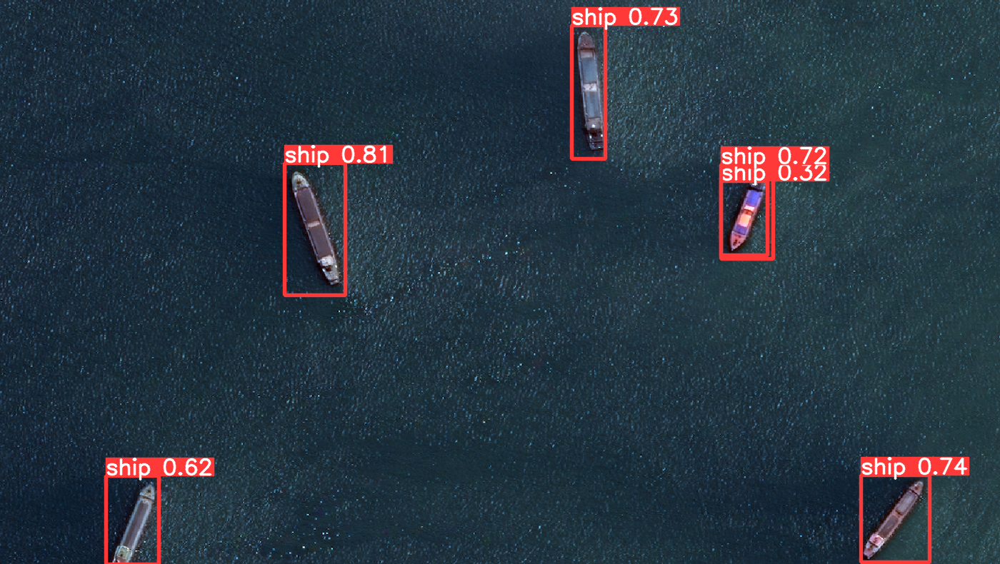

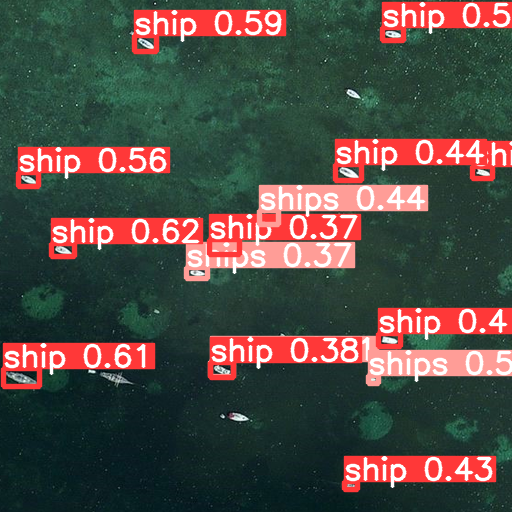

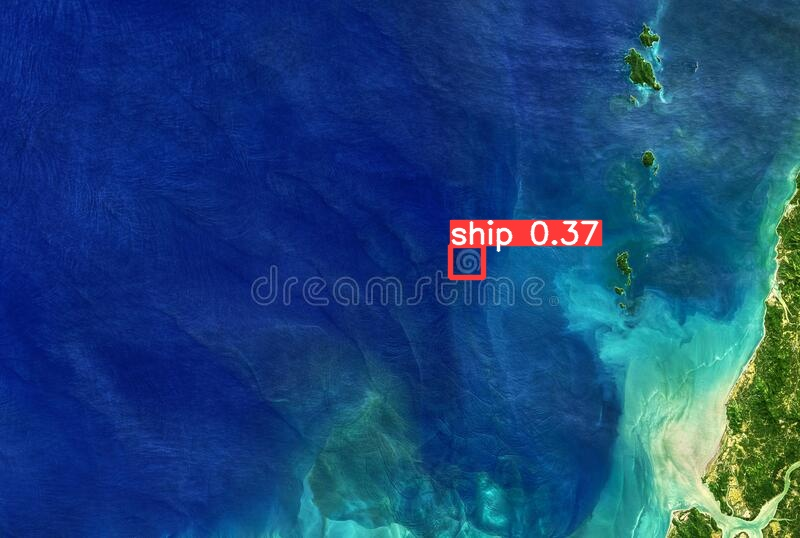

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.png'):
      display(Image(filename=image_path, width=600))
      print("\n")